Nome: Joel Alcídio Varela Mendonça

RA: 139884

Curso: Doutorado Eng. Elétrica



# Ex05 - Classificação de imagens usando rede neural convolucional (CNN)

O objetivo principal deste notebook é ilustrar e praticar o uso de redes neurais convolucionais (CNNs) para tarefas de classificação de imagens. Em relação às redes neurais convencionais, as CNNs geralmente apresentam a vantagem de possuir menos parâmetros a serem aprendidos. Além disso, as CNNs são particularmente adequadas para trabalhar com imagens devido à sua arquitetura projetada para lidar com dados espaciais de forma eficiente.

Tomaremos como base a biblioteca PyTorch, que segue uma abordagem de programação orientada a objetos. Além dela, recomendamos o uso de outras bibliotecas relacionadas (como o PyTorch Lightning) que auxiliam e simplificam etapas do framework. Note que algumas destas bibliotecas podem não estar disponíveis por padrão no Colab, sendo necessária sua instalação (como exemplificado na próxima célula de código).

Para mais informações sobre redes convolucionais, exemplos e boas práticas, recomendamos os materiais de apoio às aulas 5 e 6 disponibilizados no classroom. Lá você vai encontrar um tutorial teórico sobre CNN, além de tutoriais práticos disponibilizados no GitHub, vídeos e links de apoio. Em especial, o tutorial prático de classificação com CNN ([link](https://colab.research.google.com/drive/1uXLYbWwHT8cChAYmexV6QNUi5eI4ITod?usp=sharing)) pode ser de grande ajuda.

**Atenção!** Não se esqueça de utilizar a GPU do Colab (clique em "Ambiente de execução" e "Alterar o tipo de ambiente de execução", selecione a GPU).

In [1]:
# Instalando bibliotecas no Colab
!pip install pytorch-lightning torchinfo torchmetrics --quiet
!pip install pyngrok
!pip install -U 'mlflow>=1.0.0' --quiet
!pip install neptune --quiet

In [2]:
# Importando as bibliotecas que serão utilizadas
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob
import random
import torch
from torch import nn
from torch.utils.data import DataLoader
from torch.optim import AdamW
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torchvision import datasets, models
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torchmetrics import Accuracy
import torchinfo
from torchsummary import summary
import multiprocessing as mp
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

%load_ext tensorboard

# Definindo o nome da pasta compartilhada
# IMPORTANTE: substitua "NOME_DA_PASTA_COMPARTILHADA" abaixo pelo nome correspondente
pasta_compartilhada = "NOME_DA_PASTA_COMPARTILHADA"

In [3]:
# Conexão do colab com o drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!nvidia-smi


/bin/bash: line 1: nvidia-smi: command not found


## Parte 1 - Exemplo de classificação com o MNIST

Exemplificaremos algumas das etapas do framework de classificação com CNN utilizando o conjunto de dados MNIST (Modified National Institute of Standards and Technology database), um grande conjunto de dados de dígitos manuscritos comumente usado na área de aprendizado de máquina. Ele consiste de 60.000 imagens de treinamento e 10.000 images de teste (que, no nosso exemplo, serão utilizadas para validação). As imagens do conjunto são de 28x28 pixels. Uma descrição completa do conjunto de dados pode ser encontrada [aqui](https://en.wikipedia.org/wiki/MNIST_database).

### Leitura dos dados

Idealmente, códigos para processar amostras de dados devem estar desacoplados do código do treinamento do modelo, facilitando sua legibilidade e modularidade. O PyTorch fornece duas primitivas de dados ([torch.utils.data.DataLoader](https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) e [torch.utils.data.Dataset](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset)) que facilitam a leitura, processamento e organização dos dados para entrada no modelo. Mais informações sobre Datasets e DataLoaders podem ser encontradas [aqui](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html) e [aqui](https://blog.paperspace.com/dataloaders-abstractions-pytorch/).

In [ ]:
# Carregando os dados utilizando torchvision.datasets e convertendo as imagens para tensores
training_data = datasets.MNIST(
    root="data_mnist",
    train=True,
    download=True,
    transform=ToTensor()
)
val_data = datasets.MNIST(
    root="data_mnist",
    train=False,
    download=True,
    transform=ToTensor()
)

print(training_data)
print()
print('==========')
print(val_data)
print('==========')

print()
print("*Note que, apesar de identificado como teste, utilizaremos o segundo conjunto de dados para validação!")

100%|██████████| 9912422/9912422 [00:00<00:00, 132091219.20it/s]


Extracting data_mnist/MNIST/raw/train-images-idx3-ubyte.gz to data_mnist/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 27726183.07it/s]


Extracting data_mnist/MNIST/raw/train-labels-idx1-ubyte.gz to data_mnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 41940165.78it/s]

Extracting data_mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to data_mnist/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 5261123.66it/s]


Extracting data_mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to data_mnist/MNIST/raw

Dataset MNIST
    Number of datapoints: 60000
    Root location: data_mnist
    Split: Train
    StandardTransform
Transform: ToTensor()

Dataset MNIST
    Number of datapoints: 10000
    Root location: data_mnist
    Split: Test
    StandardTransform
Transform: ToTensor()

*Note que, apesar de identificado como teste, utilizaremos o segundo conjunto de dados para validação!


**É sempre importante checar e visualizar os dados a cada etapa do framework de classificação, garantindo que eles estão de acordo com o esperado e evitando a propagação de erros.**

2
<class 'torch.Tensor'> <class 'int'>
Shape da imagem: torch.Size([1, 28, 28])
Label: 4
Maior valor de intensidade da imagem: tensor(1.)
Menor valor de intensidade da imagem: tensor(0.)


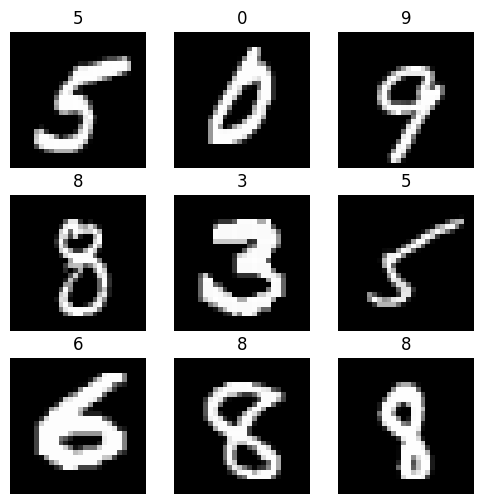

In [ ]:
# Checando informações de uma amostra de treinamento
training_example = random.choice(training_data)
print(len(training_example))
print(type(training_example[0]), type(training_example[1]))
print('Shape da imagem:', training_example[0].shape)
print('Label:', training_example[1])
print('Maior valor de intensidade da imagem:', torch.max(training_example[0]))
print('Menor valor de intensidade da imagem:', torch.min(training_example[0]))

# Visualizando algumas imagens e labels do conjunto de treinamento
figure = plt.figure(figsize=(6, 6))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    img, label =random.choice(training_data)
    plt.subplot(rows, cols, i)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray", vmin=0, vmax=1)
plt.show()

In [ ]:
#print((img[0]))
#img_batch = img[1].reshape(28, 28)

#plt.imshow(img_batch)
#img
#print(img.squeeze())
#print('-----------')
#print(img)
#plt.imshow(img.squeeze())
#plt.imshow(img)

2
<class 'torch.Tensor'> <class 'int'>
Shape da imagem: torch.Size([1, 28, 28])
Label: 8
Maior valor de intensidade da imagem: tensor(1.)
Menor valor de intensidade da imagem: tensor(0.)


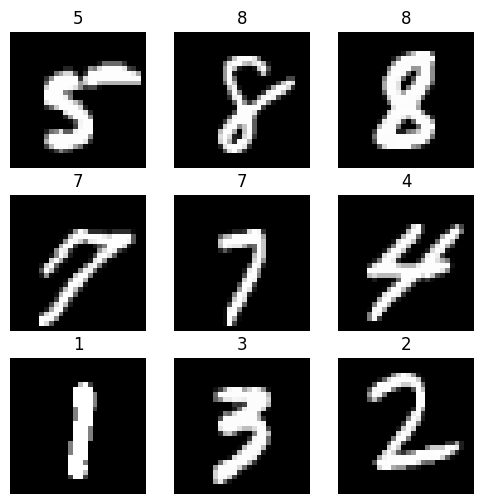

In [ ]:
# Checando informações de uma amostra de validação
val_example = random.choice(val_data)
print(len(val_example))

print(type(val_example[0]), type(val_example[1]))
print('Shape da imagem:', val_example[0].shape)
print('Label:', val_example[1])
print('Maior valor de intensidade da imagem:', torch.max(val_example[0]))
print('Menor valor de intensidade da imagem:', torch.min(val_example[0]))

# Visualizando algumas imagens e labels do conjunto de validação
figure = plt.figure(figsize=(6, 6))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    img, label = random.choice(val_data)
    plt.subplot(rows, cols, i)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray", vmin=0, vmax=1)
plt.show()


### Exercício 1.1

Explique o processamento aplicado pela classe torchvision.transforms.ToTensor às imagens do conjunto. Explique também porque foi necessário utilizar o .squeeze() para visualizar as imagens e qual a sua função.

RESPOSTA: O ToTensor é uma etapa de pré-processamento essencial ao trabalhar com imagens no PyTorch. Ele converte imagens do formato PIL ou arrays NumPy, que têm valores de pixel na faixa de 0 a 255, em tensores do PyTorch. Durante essa conversão, os valores dos pixels são ajustados para a faixa de 0 a 1. Além disso, as dimensões do tensor são organizadas de uma maneira específica, passando de (Altura x Largura x Canais) para (Canais x Altura x Largura).

Essa transformação é necessária para preparar os dados para alimentar redes neurais profundas e outros modelos de aprendizado de máquina no PyTorch. Ao converter os dados para o formato de tensor, eles se tornam compatíveis com operações eficientes de álgebra linear e podem ser processados de forma eficaz pela GPU, acelerando o treinamento e a inferência do modelo.

 No exemplo apresentado acima, a função `squeeze()`  é usado para remover dimensões de tamanho 1 do tensor. Isso é necessário porque, quando temos uma imagem em tons de cinza com dimensões (Altura x Largura) e aplicamos a transformação `ToTensor()`, o PyTorch cria um tensor com dimensões (1 x Altura x Largura), adicionando uma dimensão para representar os canais de cor.

Entretanto, ao tentar visualizar essa imagem em tons de cinza convertida para tensor, enfrentamos um problema. A função de visualização de imagens `plt.imshow` espera que o tensor tenha apenas dimensões (Altura x Largura), sem a dimensão adicional dos canais de cor. Portanto, utilizamos `squeeze()` para remover essa dimensão extra e garantir que a visualização da imagem seja feita corretamente.


### Hiperparâmetros

É interessante utilizar um dicionário de hiperparâmetros para organizar o código, evitar "números mágicos" e registrar as configurações de cada experimento realizado.

In [ ]:
hparams = {"experiment_name": "Test_ResNet_1",  # experiment name identifies the run for later
           "max_epochs": 1,  # number of epochs to train
           "batch_size": 100,  # size of batch
           "nworkers": mp.cpu_count(),  # number of workers to use in parallel loading
           "nout": 10,  # number of classes
           "nin": 1,  # number of channels of the input image
           "lr": 1e-4,  # learning rate
           "wd": 1e-5,  # weight decay for optimizer
           "cpu": False,  # forces using the CPU
           }

for k, v in hparams.items():
    print(f"{k}: {v}")

experiment_name: Test_ResNet_1
max_epochs: 1
batch_size: 100
nworkers: 2
nout: 10
nin: 1
lr: 0.0001
wd: 1e-05
cpu: False


### Data Module

A classe [pytorch_lightning.LightningDataModule](https://lightning.ai/docs/pytorch/stable/data/datamodule.html) pode ser utilizada para organizar os DataLoaders e os dados.

In [ ]:
class MNISTDataModule(pl.LightningDataModule):
    def __init__(self, hparams):
        super().__init__()
        self.save_hyperparameters(hparams)

    def setup(self, stage=None):
        self.train = training_data
        self.val = val_data

    '''
    Dataloaders optimize data loading and automatically prepare batches
    '''

    def train_dataloader(self):
        return DataLoader(self.train, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=False)


**Novamente, checamos os dados obtidos através do DataModule.**

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


torch.Size([100, 1, 28, 28])
Shape do batch: torch.Size([100, 1, 28, 28])


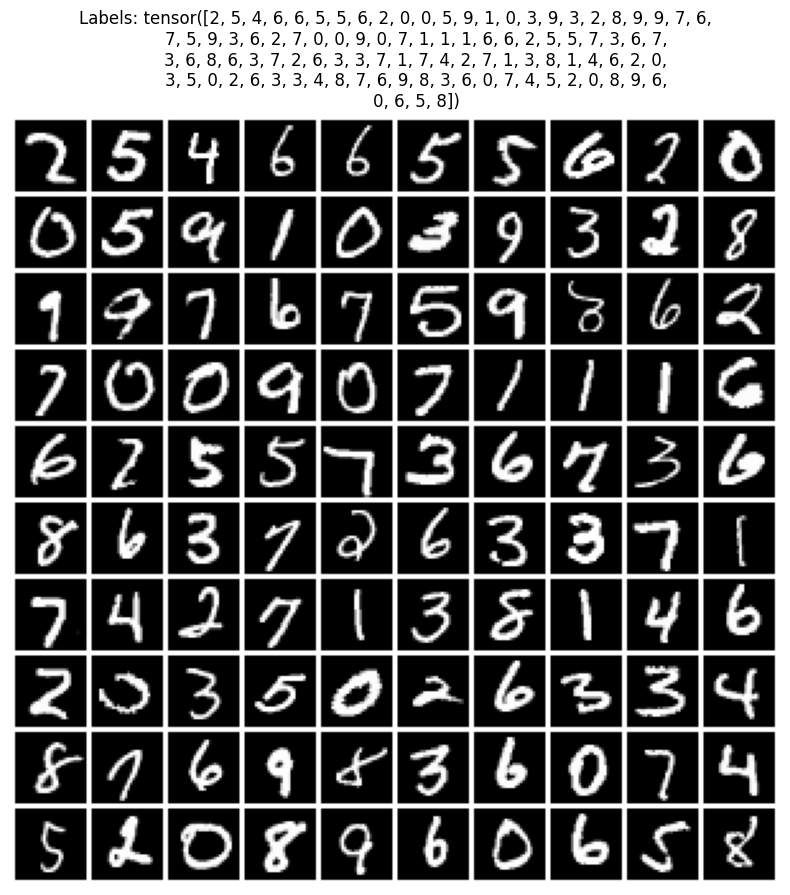

In [ ]:
# DEBUG DATA MODULE
data_module = MNISTDataModule(hparams)
data_module.setup()

dataloader = data_module.train_dataloader()
img_batch, label_batch = next(iter(dataloader))
print(np.shape(img_batch))
#print((img_batch[0]))
#img_batch = img_batch[1].reshape(28, 28)

#plt.imshow(img_batch)


print("Shape do batch:", img_batch.shape)
img_grid = make_grid(img_batch, nrow=10, pad_value=1)
fig = plt.figure(figsize=(10,10))
plt.imshow(img_grid.permute(1, 2, 0).numpy())
plt.title(f'Labels: {label_batch}')
plt.axis('off')
plt.show()





### Definindo a CNN

No código abaixo, é criado um modelo baseado na [Resnet-18](https://pytorch.org/vision/master/models/generated/torchvision.models.resnet18.html). O mesmo será treinado **sem transfer learning** e com uma inicialização randômica dos pesos. Visualizamos também todas as camadas (layers) que compõem o modelo e seus parâmetros.

In [ ]:
cnn_model = models.resnet18(weights=None)
print(cnn_model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
cnn_model.conv1 = nn.Conv2d(hparams['nin'], 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
num_ftrs = cnn_model.fc.in_features
cnn_model.fc = nn.Linear(num_ftrs, hparams['nout'])
print(cnn_model)

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Exercício 1.2

Para que serve cada camada da rede? Por que foi necessário modificar ligeiramente a rede (célula anterior) e que modificações foram realizadas?

# RESPOSTA:
O modelo ResNet-18 é uma Rede Neural Convolucional (CNN) que consiste em várias camadas, cada uma com uma função específica.

A **camada Conv1** é a primeira camada da rede, responsável por aplicar filtros à imagem de entrada e extrair características básicas.**sta camada usa um kernel de convolução de tamanho 7x7, um passo stride de 2 e um preenchimento padding de 3, o que ajuda a reduzir a resolução da imagem e aumentar a eficiência computacional.

As **camadas de normalização em lote (BatchNorm)**: Estas camadas normalizam os dados de entrada em lote, o que ajuda a acelerar o treinamento e reduzir a possibilidade de sobreajuste.

As **Camadas de ativação (ReLU)**: Estas camadas aplicam a função de ativação ReLU (Rectified Linear Unit) aos dados de entrada. A função ReLU é definida como f(x) = max(0, x), o que significa que ela zera todos os valores negativos.

A **camada residuais** contém uma série de blocos residuais, que são a característica definidora das redes ResNet. Cada bloco residual contém atalhos ou conexões de salto que ajudam a evitar o problema do gradiente evanescente em redes profundas, permitindo o treinamento eficaz de redes muito profundas.

As **camadas de Pooling** desempenham um papel crucial na redução das dimensões espaciais dos mapas de características. Isso não apenas economiza recursos computacionais, mas também ajuda a evitar o overfitting e a aumentar a invariância de translação.

As **Camadas totalmente conectadas (Linear)** é a última camada da rede. Ela recebe as características extraídas pelas camadas anteriores e as usa para classificar a imagem de entrada em várias classes. Cada neurônio na camada FC representa uma classe específica. A classe da imagem de entrada é determinada pelo neurônio que produz a maior saída.



A camada convolucional inicial é alterada para se adaptar ao número de canais de entrada especificado em hparams['nin'], como no nosso caso a imagem está em escala de cinza esse parâmetro é igual a 1. Normalmente, a ResNet-18 é projetada para imagens RGB padrão, que têm três canais de cores.
A camada totalmente conectada também foi modificada para produzir um número diferente de saídas (hparams['nout']), correspondendo ao número de classes no problema de classificação.







### Resumo do modelo

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
cnn_model.to(device)
summary(cnn_model, (1, 28, 28))

cpu
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 14, 14]           3,136
       BatchNorm2d-2           [-1, 64, 14, 14]             128
              ReLU-3           [-1, 64, 14, 14]               0
         MaxPool2d-4             [-1, 64, 7, 7]               0
            Conv2d-5             [-1, 64, 7, 7]          36,864
       BatchNorm2d-6             [-1, 64, 7, 7]             128
              ReLU-7             [-1, 64, 7, 7]               0
            Conv2d-8             [-1, 64, 7, 7]          36,864
       BatchNorm2d-9             [-1, 64, 7, 7]             128
             ReLU-10             [-1, 64, 7, 7]               0
       BasicBlock-11             [-1, 64, 7, 7]               0
           Conv2d-12             [-1, 64, 7, 7]          36,864
      BatchNorm2d-13             [-1, 64, 7, 7]             128
             ReLU-14             [-

### Exercício 1.3

Tente entender as dimensões da saída de cada camada da rede. Por exemplo, porque as três primeiras camadas possuem saídas com dimensões (-1, 64, 14, 14) e a quarta camada tem saída com dimensões (-1, 64, 7, 7)?

E quanto aos parâmetros a serem aprendidos, você consegue explicar como eles são calculados?

RESPOSTA: As três primeiras camadas (Conv2d-1, BatchNorm2d-2, ReLU-3) produzem saídas com dimensões (-1, 64, 14, 14) porque aplicam essencialmente operações de convolução e ativação, sem reduzir as dimensões espaciais da entrada. Por outro lado, a quarta camada gera uma saída com dimensões (-1, 64, 7, 7) devido à aplicação de max pooling, que reduz pela metade as dimensões espaciais da entrada.

Os parâmetros a serem apreendidos em uma rede neural são ajustes que a rede faz para aprender a partir dos dados. Eles incluem os pesos, que determinam a importância das diferentes partes dos dados, e os vieses, que ajudam a rede a aprender de forma mais flexivel.

Esses parâmetros são calculados da seguinte forma:

Em uma **camada convolucional**, os parâmetros aprendiveis são os proprios filtros convolucionais. Cada filtro é uma matriz que tem um conjunto de pesos e um unico viés. O filtro é aplicada à entrada para produzir a saída convolucional.

O número total de parâmetros em uma **camada convolucional** é calculado pelo tamanho do filtro, número canais da imagem de entrada e o número de filtros.
Se o filtro for de tamanho F x F e a imagem de entrada tiver um numero de canais C, então numero total de parametro para cada filtro é F x F x C, isso porque cada peso está associado a um unico pixel em um unico canal da imagem.
Portanto,  se uma camada convolucional tem N filtros de tamanho F x F, então o número de parâmetros é dado por:

Num_param = N x (F X F x C + 1)

Lembrando o "1" apresentado na equação acima é o viés que cada filtro possui.


A **camada totalmente conectada (Linear-68)** está localizada após as camadas convolucionais e é responsável por transformar os recursos (features) extraídos das camadas convolucionais em previsões para as diferentes classes.
O número de parâmetros na camada totalmente conectada é determinado pelo número de unidades de neurônios nesta camada(Num_Neu_1) e pelo número de unidades de neuronios na camada anterior(Num_Neu_0), bem como pelos vieses associados.
Portanto, o número total de parâmetros na camada totalmente conectada pode ser calculado como:

Num_param = (Num_Neu_0 + 1)*Num_Neu_1

O "1" presente na formula logo acima é devido os vieses associados a cada unidade na camada totalmente conectada.

Uma **camada totalmente conectada** tem um peso para cada par de neurônios de entrada e saída, além de um viés para cada neurônio de saída. Portanto, se o número de neurônios de entrada for N_in e o número de neurônios de saída for N_out, o número total de parâmetros (pesos + vieses) será N_in x N_out + N_out.


### Lightning Module

Aqui definimos o comportamento durante o treinamento, ou seja, o que acontece com um lote retornado pelo DataLoader.

In [ ]:
class TrainMNIST(pl.LightningModule):
    def __init__(self, hparams):
        super().__init__()

        self.save_hyperparameters(hparams)
        self.model = cnn_model
        self.loss = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=self.hparams.nout)

        torchinfo.summary(self.model)

    def forward(self, x):
        return self.model(x).softmax(dim=-1)

    def classification_step(self, mode, batch):
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss(y_hat, y)

        if mode == "train":
            self.log("loss", loss, on_epoch=True, on_step=True)
            return loss
        elif mode == "val":
            _, preds = torch.max(y_hat, 1)
            self.accuracy(preds, y)
            self.log("val_loss", loss, on_epoch=True, on_step=False, prog_bar=True)
            self.log("val_acc", self.accuracy, on_epoch=True, on_step=False, prog_bar=True)

    def training_step(self, train_batch, batch_idx):
        return self.classification_step("train", train_batch)

    def validation_step(self, val_batch, batch_idx):
        self.classification_step("val", val_batch)

    def configure_optimizers(self):
        optimizer = AdamW(self.model.parameters(), lr=self.hparams.lr, weight_decay=self.hparams.wd)

        return optimizer

### Treinando a CNN

In [ ]:
#import pytorch_lightning as pl
#from pytorch_lightning.callbacks import ModelCheckpoint
#cnn_model = models.resnet18(weights=None)
#class TrainMNIST(pl.LightningModule):


debug = True  # Turn this True to test the code with a quick run

# Initialization
model = TrainMNIST(hparams)
data = MNISTDataModule(hparams)


# The PL trainer can run various callbacks during training. Here we only use the
# callback that saves the weights of the trained network.
os.makedirs("logs", exist_ok=True)
checkpoint_callback = [ModelCheckpoint(dirpath="logs",  # path to save checkpoint
                                       filename=hparams["experiment_name"] + "-{epoch}-{val_acc:.2f}",
                                       monitor="val_acc",
                                       mode="max")]

trainer = pl.Trainer(max_epochs=hparams["max_epochs"],
                     fast_dev_run=debug,
                     callbacks=checkpoint_callback,
                     log_every_n_steps=1
                     )
'''
print("Hyperparameters:\n")
for k, v in hparams.items():
    print(f'{k}: {v}')
'''
print('##########')
print(data)
print('##########')

trainer.fit(model, data)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:Running in `fast_dev_run` mode: will run the requested loop using 1 batch(es). Logging and checkpointing is suppressed.


##########
##########


INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNet             | 11.2 M
1 | loss     | CrossEntropyLoss   | 0     
2 | accuracy | MulticlassAccuracy | 0     
------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.701    Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1` reached.


In [ ]:
#import pytorch_lightning as pl
#from pytorch_lightning.callbacks import ModelCheckpoint
#cnn_model = models.resnet18(weights=None)
#class TrainMNIST(pl.LightningModule):


debug = True  # Turn this True to test the code with a quick run

# Initialization
model = TrainMNIST(hparams)
data = MNISTDataModule(hparams)

print(data)
'''
# The PL trainer can run various callbacks during training. Here we only use the
# callback that saves the weights of the trained network.
os.makedirs("logs", exist_ok=True)
checkpoint_callback = [ModelCheckpoint(dirpath="logs",  # path to save checkpoint
                                       filename=hparams["experiment_name"] + "-{epoch}-{val_acc:.2f}",
                                       monitor="val_acc",
                                       mode="max")]

trainer = pl.Trainer(max_epochs=hparams["max_epochs"],
                     fast_dev_run=debug,
                     callbacks=checkpoint_callback,
                     log_every_n_steps=1
                     )

print("Hyperparameters:\n")
for k, v in hparams.items():
    print(f'{k}: {v}')

trainer.fit(model, data)
'''
training_data = datasets.MNIST(
    root="data_mnist",
    train=True,
    download=True,
    transform=ToTensor()
)
val_data = datasets.MNIST(
    root="data_mnist",
    train=False,
    download=True,
    transform=ToTensor()
)
class MNISTDataModule(pl.LightningDataModule):
    def __init__(self, hparams):
        super().__init__()
        self.save_hyperparameters(hparams)

    def setup(self, stage=None):
        self.train = training_data
        self.val = val_data

    '''
    Dataloaders optimize data loading and automatically prepare batches
    '''
    def train_dataloader(self):
        return DataLoader(self.train, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val, batch_size=self.hparams.batch_size, num_workers=self.hparams.nworkers, shuffle=False)

hparams = {"experiment_name": "Test_ResNet_1",  # experiment name identifies the run for later
           "max_epochs": 10,  # number of epochs to train
           "batch_size": 100,  # size of batch
           "nworkers": mp.cpu_count(),  # number of workers to use in parallel loading
           "nout": 10,  # number of classes
           "nin": 1,  # number of channels of the input image
           "lr": 1e-4,  # learning rate
           "wd": 1e-5,  # weight decay for optimizer
           "cpu": False,  # forces using the CPU
           }

data = MNISTDataModule(hparams)


### Visualizando os logs de treinamento

Por padrão, o Pytorch Lightning registra os resultados do treinamento usando o TensorBoard. Você pode configurar muitos outros registradores (https://pytorch-lightning.readthedocs.io/en/stable/extensions/logging.html), recomendamos verificar o Neptune ou o MLFlow. Utilize esses registradores para comparar experimentos!

Abaixo é possível verificar os resultados do treinamento realizado previamente (disponibilizado no diretório **Dados/Ex05/saved_lightning_logs**).

In [ ]:
path = f"gdrive/MyDrive/Dados/Ex05/saved_lightning_logs"


%tensorboard --logdir {path}

<IPython.core.display.Javascript object>

### Análise dos resultados

Após o treinamento da rede, é importante checar os resultados de validação, visualizando algumas saídas da rede e obtendo métricas de classificação. Abaixo exemplificamos a visualização da matriz de confusão utilizando o checkpoint de um trinamento realizado previamente (disponibilizado no diretório **Dados/Ex05/saved_logs**).

In [ ]:
# WARNING: This will load a random checkpoint from the logs folder, if you want an specific one change it!
baseline_model = random.choice(glob(f"gdrive/MyDrive/{pasta_compartilhada}/Dados/Ex05/saved_logs/*.ckpt"))
print(f"Using model {baseline_model}")

# Load trained model
model = TrainMNIST.load_from_checkpoint(baseline_model).eval().cuda()

# Initialize validation data
data = MNISTDataModule(hparams)
data.setup()
data.hparams.batch_size = 1
val_data = data.val_dataloader()

def collect_2d_results(data, model):
    y_trues = []
    y_labels = []
    for (img, label) in data:
        with torch.no_grad():
            out = model(img.cuda()).argmax(dim=-1).item()

        label = label.numpy()
        y_trues.append(label)
        y_labels.append(out)

    return y_trues, y_labels

y_trues_val, y_labels_val = collect_2d_results(val_data, model)

Using model logs\Test_ResNet_1-epoch=7-val_acc=0.99.ckpt


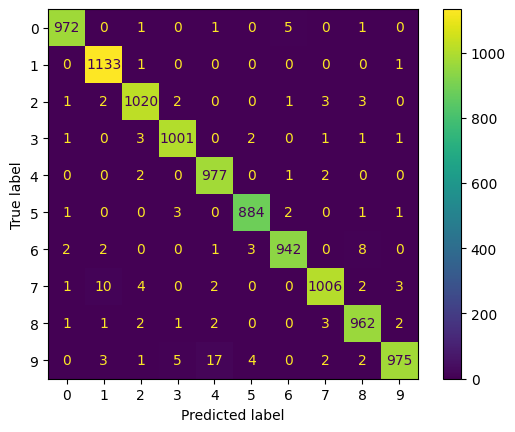

In [ ]:
# Confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_trues_val, y_labels_val, labels=np.arange(10)),
                                display_labels=np.arange(10))
fig = disp.plot(ax=None).figure_
plt.show()

Por fim, o modelo final seria avaliado em um conjunto de teste (que não está disponível no exemplo apresentado). **Vale ressaltar que o conjunto de teste não deve ser utilizado para refinar o modelo! Ele deve ser utilizado apenas para uma avaliação final do modelo.**

## Parte 2 - Classificação com o DermaMNIST

Vamos retomar a classificação do dataset de imagens dermatoscópicas de lesões de pele comuns, utilizado no Exercício 02. Desta vez, ao invés de extrair os atributos "artesanalmente" e classificar com o KNN, utilizaremos CNNs para realizar os dois processos simultaneamente (extração de atributos + classificação).

**Dataset**

O dataset consiste em 600 imagens de lesões de pele, obtidas ao longo de 20 anos em dois hospitais diferentes. Como as imagens foram obtidas e armazenadas de diferentes formas ao longo do tempo (armazenadas em arquivos PowerPoint, por exemplo), elas passaram por um processo de seleção, organização e padronização para compor o dataset. Assim, as imagens foram cortadas em torno das lesões de modo a deixá-las centralizadas e, em alguns casos, tiveram seus histogramas corrigidos manualmente para melhorar o contraste visual e a reprodução de cores.

As imagens estão divididas em dois tipos de lesão de pele:
- 300 casos de carcinoma basocelular (label 0) - um tipo de câncer de pele que começa nas células basais, raramente apresenta metástase, mas cresce de forma destrutiva se não tratado;
- 300 casos de melanoma (label 1) - o tipo mais grave de câncer de pele, que começa nas células produtoras de melanina, é quase sempre curável em estágios iniciais, mas tende a apresentar metástase com o tempo.

O dataset está separado em um conjunto de treino com 400 imagens (200 de cada classe), um conjunto de validação com 100 imagens (50 de cada classe) e um conjunto de teste com 100 imagens (50 de cada classe). As imagens devem ser classificadas em 0 ou 1, representando os dois tipos de lesões presentes no dataset (carcinoma ou melanoma, respectivamente).

### Exercício 2.1

Com base no exemplo apresentado e nos materiais de apoio disponibilizados, treine uma CNN para classificar as lesões de pele. O dataset está disponível no diretório **Dados/Ex05/Derma_MNIST_Dataset**. Considere as recomendações abaixo:

- Para a leitura dos dados, você pode criar um [Dataset customizado](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) ou ainda utilizar a classe [torchvision.datasets.ImageFolder](https://pytorch.org/vision/main/generated/torchvision.datasets.ImageFolder.html).
- Considere aplicar [transformações](https://pytorch.org/vision/stable/transforms.html) durante a leitura dos dados, seja para normalizá-los ou realizar aumentação de dados.
- Lembre-se de sempre checar os dados!
- Você pode definir sua própria rede ou utilizar modelos de classificação disponibilizados pelo PyTorch (como a [ResNet](https://pytorch.org/vision/stable/models/resnet.html) ou a [EfficientNet](https://pytorch.org/vision/stable/models/efficientnet.html)). Caso utilize modelos disponibilizados, tome cuidado com as entradas e saídas da rede, talvez seja necessário realizar algumas modificações (como no exemplo apresentado). Considere também a utilização de modelos pré-treinados, eles apresentam resultados melhores do que modelos inicializados com pesos randômicos?
- Note que, no exemplo apresentado, os checkpoints da rede e os logs do PyTorch Lightning ficam salvos no ambiente de execução do Colab. Tome cuidado para não acabar perdendo experimentos! Você pode alterar o local em que esses arquivos são salvos para que sejam armazenados no seu Drive ou ainda salvar manualmente os arquivos que julgar importantes.
- Tente modificar os hiperparâmetros para obter melhores resultados de validação.
- Verifique os resultados do modelo: visualize algumas saídas da rede e obtenha métricas de classificação (acurácia, precisão, revocação e F1-score), além de imprimir a matriz de confusão.
- Idealmente, você deve avaliar apenas o modelo final no conjunto de teste.

Comente os métodos utilizados e resultados obtidos, tentando justificar as decisões que foram tomadas. Compare também os resultados obtidos através da CNN com os resultados obtidos através do KNN no Exercício 02.

In [ ]:
# Os hiperparametros da minha rede

hparams = {"experiment_name": "Test_ResNet_1",  # experiment name identifies the run for later
           "max_epochs": 50,  # number of epochs to train
           "batch_size_train": 400,  # size of batch
           "batch_size_val": 100,  # size of batch
           "nworkers": mp.cpu_count(),  # number of workers to use in parallel loading
           "nout": 2,  # number of classes
           "nin": 3,  # number of channels of the input image
           "lr": 1e-4,  # learning rate
           "wd": 1e-5,  # weight decay for optimizer
           "cpu": False,  # forces using the CPU
           }

'''
Estamos tentando distinguir entre imagens pertencentes a dois grupos diferentes: carcinoma basocelular (rótulo 1) e melanoma (rótulo 4).
Cada imagem é atribuída a uma dessas duas classes: rótulo 1 ou rótulo 4. Para representar o número de classes, utilizamos "nout" = 2.

Além disso, como estamos lidando com imagens coloridas no formato RGB, onde cada pixel é representado por três valores correspondentes às
intensidades de vermelho, verde e azul, o parâmetro que representa o número de canais, "nin", é definido como três.
'''


'\nComo estamos tentando distiguir entre imagens percententes a dois grupos diferentes\ncarcinoma basocelular (label 1) e  melanoma (label 4), ou seja cada imagem é\natribuida a uma de duas classe: label 1 e label4. Por causa disso eu uso "nout" = 2.\n\nE outra coisa, como estamos trabalhando com imagens coloridas ou seja imagens RGB,\no parametro que representa o número de canais "nin" é definido como três.\n'

Shape do batch: torch.Size([400, 3, 28, 28])


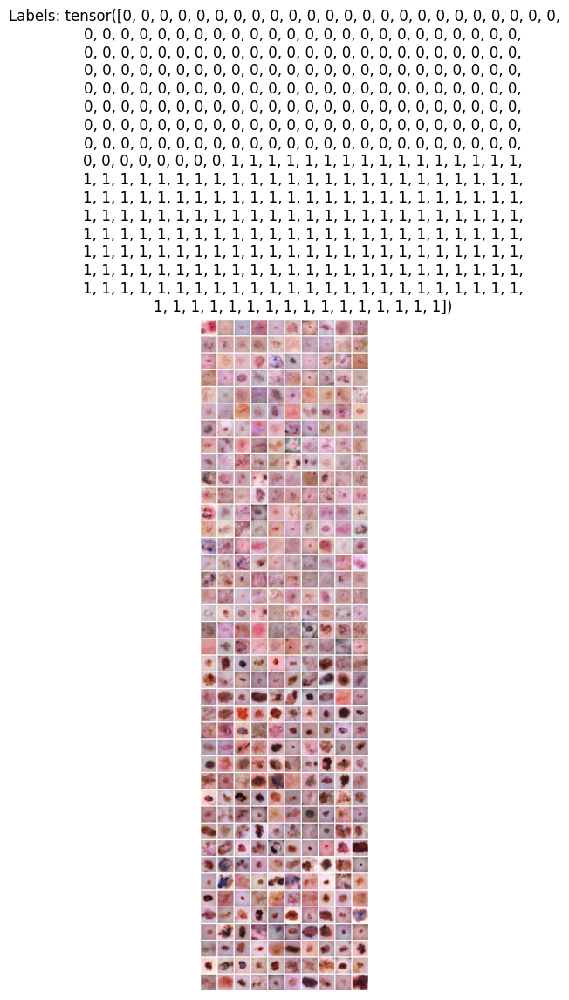

In [ ]:
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
'''
Carrega e pré-processa conjuntos de dados de treinamento, validação e teste para
um problema de classificação de imagens.

'''
# Caminho para os dados de treinamento e validação
train_data_dir = f"gdrive/MyDrive/Dados/Ex05/Derma_MNIST_Dataset/train/"
val_data_dir = f"gdrive/MyDrive/Dados/Ex05/Derma_MNIST_Dataset/val/"
test_data_dir = f"gdrive/MyDrive/Dados/Ex05/Derma_MNIST_Dataset/test/"

# Transformação para converter as imagens em tensores
transform = transforms.Compose([
    #transforms.Resize((224, 224)),  # Redimensiona as imagens para 224x224 pixels
    transforms.ToTensor(),           # Converte as imagens para tensores
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normaliza os pixels das imagens
])
# Carrega os dados de treinamento, validação e teste
train_data = datasets.ImageFolder(root=train_data_dir, transform=transform)
val_data = datasets.ImageFolder(root=val_data_dir, transform=transform)
test_data = datasets.ImageFolder(root=val_data_dir, transform=transform)


def show_image(dataset, size):
  '''
   Mostra uma grade de imagens de um conjunto de dados.

    Args:
        dataset (torchvision.datasets.ImageFolder): Conjunto de dados contendo as imagens.
        size (int): Tamanho do lote de imagens a ser mostrado.

  '''
  data_loader = torch.utils.data.DataLoader(dataset, batch_size=size, shuffle=False)
  # Itera sobre o primeiro lote de dados 'data_loader'
  images, labels = next(iter(data_loader))


  print("Shape do batch:", images.shape)
  img_grid = make_grid(images, nrow=10, pad_value=1)
  fig = plt.figure(figsize=(10,10))
  plt.imshow(img_grid.permute(1, 2, 0).numpy())
  plt.title(f'Labels: {labels}')
  plt.axis('off')
  plt.show()


show_image(train_data, 400)



In [ ]:
'''
Esta classe é usada para preparar e carregar dados para treinamento e validação
da rede utilizando PyTorch Lightning. Ela permite configurar conjuntos de dados de
treinamento e validação, bem como obter DataLoaders para esses conjuntos de dados.
'''

class Skin_Image_DataModule(pl.LightningDataModule):
    def __init__(self, hparams):
        '''
        Args:
            hparams (dict): Dicionário contendo os hiperparâmetros para configurar o módulo de dados.
        '''
        super().__init__()
        self.save_hyperparameters(hparams)

    def setup(self, stage=None):
        # Define os conjuntos de dados de treinamento e validação
        self.train = train_data
        self.val = val_data


    def train_dataloader(self):
        # Retorna o DataLoader para o conjunto de dados de treinamento
        return DataLoader(self.train, batch_size=self.hparams.batch_size_train, num_workers=self.hparams.nworkers, shuffle=True)

    def val_dataloader(self):
        # Retorna o DataLoader para o conjunto de dados de validação
        return DataLoader(self.val, batch_size=self.hparams.batch_size_val, num_workers=self.hparams.nworkers, shuffle=False)


In [ ]:
from torch import nn
from torchmetrics import Accuracy

'''
Esta classe herda de LightningModule do PyTorch Lightning e é responsável por definir a arquitetura
do modelo, calcular as perdas, atualizar os pesos durante o treinamento e avaliar o desempenho do modelo.

'''

class Train_Skin_Image(pl.LightningModule):
    def __init__(self, hparams):
        super().__init__()

        self.save_hyperparameters(hparams)
        self.model = cnn_model
        self.loss = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=self.hparams.nout)

        torchinfo.summary(self.model)

    def forward(self, x):
        '''
        Método forward que define como os dados fluem através do modelo

        Args:
            x (torch.Tensor): Os dados de entrada

        Returns:
            torch.Tensor: As previsões do modelo
        '''
        return self.model(x).softmax(dim=-1)

    def classification_step(self, mode, batch):
        '''
        Método para executar uma etapa de classificação durante o treinamento ou a validação.

        Args:
            mode (str): Modo de operação, "train" para treinamento e "val" para validação.
            batch (tuple): Um lote de dados contendo imagens e rótulos.

        Returns:
            torch.Tensor: A perda calculada durante a etapa de classificação.

        '''
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss(y_hat, y)

        if mode == "train":
            self.log("loss", loss, on_epoch=True, on_step=True)
            return loss
        elif mode == "val":
            _, preds = torch.max(y_hat, 1)
            self.accuracy(preds, y)
            self.log("val_loss", loss, on_epoch=True, on_step=False, prog_bar=True)
            self.log("val_acc", self.accuracy, on_epoch=True, on_step=False, prog_bar=True)

    def training_step(self, train_batch, batch_idx):
        '''
        Método para executar uma etapa de treinamento.

        Args:
            train_batch (tuple): Um lote de dados de treinamento contendo imagens e rótulos.
            batch_idx (int): O índice do lote atual.

        Returns:
            torch.Tensor: A perda calculada durante a etapa de treinamento.

        '''
        return self.classification_step("train", train_batch)

    def validation_step(self, val_batch, batch_idx):
        '''
        Método para executar uma etapa de validação

        Args:
            val_batch (tuple): Um lote de dados de validação contendo imagens e rótulos.
            batch_idx (int): O índice do lote atual

        '''
        self.classification_step("val", val_batch)

    def configure_optimizers(self):
        '''
        Método para configurar o otimizador a ser utilizado durante o treinamento.

        Returns:
            torch.optim.Optimizer: O otimizador configurado.
        '''
        optimizer = AdamW(self.model.parameters(), lr=self.hparams.lr, weight_decay=self.hparams.wd)

        return optimizer


In [ ]:
'''
Este código define a arquitetura de uma rede neural convolucional ResNet-18 para classificação de imagens.

A rede é construída a partir do modelo ResNet-18 pré-treinado disponível no PyTorch torchvision,
com os pesos inicializados aleatoriamente.

O código substitui a camada de convolução inicial (conv1) para se ajustar ao número de canais de entrada
definido nos hiperparâmetros (hparams_2['nin']). Em seguida, a camada totalmente conectada (fc) é substituída
por uma nova camada linear com o número de unidades de saída definido nos hiperparâmetros (hparams_2['nout']).

Attributes:
    cnn_model (torch.nn.Module): O modelo da rede neural convolucional ResNet-18 modificado.
'''

# Carregar o modelo ResNet-18 pré-treinado
#cnn_model = models.resnet18(pretrained=True)

cnn_model = models.resnet18(weights=None)

cnn_model.conv1 = nn.Conv2d(hparams['nin'], 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
num_ftrs = cnn_model.fc.in_features
cnn_model.fc = nn.Linear(num_ftrs, hparams['nout'])



In [ ]:
import os
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.loggers import NeptuneLogger
import neptune.new as neptune

debug = False  # Turn this True to test the code with a quick run

# Este código inicializa um novo experimento no Neptune, uma plataforma para registro e visualização de experimentos de aprendizado de máquina.
run = neptune.init_run(
    project='joelavmendonca/skinimageteste',
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJlOTQ4MDI5Ny1mMjdhLTRkMmMtYTk0Ny0zMzg1NmU1YTI2NWEifQ==",
    )

run["parameters"] = {
    "learning_rate": hparams["lr"],
    "max_epochs": hparams["max_epochs"],
    # Adicione outros hiperparâmetros aqui
}

# Inicializa o logger do Neptune para registro de métricas e parâmetros
neptune_logger = NeptuneLogger(
    api_key="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJlOTQ4MDI5Ny1mMjdhLTRkMmMtYTk0Ny0zMzg1NmU1YTI2NWEifQ==",  # Substitua YOUR_API_KEY pelo seu token de API do Neptune
    project="joelavmendonca/skinimageteste",  # Substitua 'username/project_name' pelo seu nome de usuário e nome do projeto
    name="skinimageteste"  # Defina o nome do experimento
)


log_dir = f"gdrive/MyDrive/logs_lightning"

# Este código configura o logger do TensorBoard para registrar os dados do treinamento e validação em um diretório específico.
logger = TensorBoardLogger(log_dir, name="skin_logs")



# Initialization
# Este código instancia o modelo de rede neural e o módulo de dados para treinamento e validação.
model = Train_Skin_Image(hparams)
data = Skin_Image_DataModule(hparams)



# The PL trainer can run various callbacks during training. Here we only use the
# callback that saves the weights of the trained network.
os.makedirs(log_dir, exist_ok=True)

# Este código configura o treinamento do modelo, incluindo a definição de callbacks e outros parâmetros.
checkpoint_callback = [ModelCheckpoint(dirpath=log_dir,  # path to save checkpoint
                                       filename=hparams["experiment_name"] + "-{epoch}-{val_acc:.2f}",
                                       monitor="val_acc",
                                       mode="max")]
# Este código configura o objeto Trainer do PyTorch Lightning para controlar o treinamento do modelo.
trainer = pl.Trainer(max_epochs=hparams["max_epochs"],
                     fast_dev_run=debug,
                     callbacks=checkpoint_callback,
                     logger=neptune_logger,
                     #logger = logger,
                     log_every_n_steps=1
                     )

print("Hyperparameters:\n")
for k, v in hparams.items():
    print(f'{k}: {v}')


trainer.fit(model, data)


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/joelavmendonca/skinimageteste/e/SKIN-86


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Hyperparameters:

experiment_name: Test_ResNet_1
max_epochs: 50
batch_size_train: 400
batch_size_val: 100
nworkers: 2
nout: 2
nin: 3
lr: 0.0001
wd: 1e-05
cpu: False
[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/joelavmendonca/skinimageteste/e/SKIN-87


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /content/gdrive/MyDrive/logs_lightning exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNet             | 11.2 M
1 | loss     | CrossEntropyLoss   | 0     
2 | accuracy | MulticlassAccuracy | 0     
------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.710    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Training: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 0.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 0.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 1.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 1.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 2.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 2.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 3.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 3.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 4.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 4.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 5.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 5.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 6.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 6.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 7.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 7.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 8.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 8.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 9.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 9.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 10.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 10.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 11.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 11.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 12.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 12.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 13.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 13.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 14.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 14.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 15.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 15.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 16.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 16.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 17.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 17.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 18.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 18.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 19.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 19.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 20.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 20.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 21.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 21.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 22.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 22.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 23.0


[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 23.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 24.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 24.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 25.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 25.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 26.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 26.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 27.0


[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 27.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 28.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 28.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 29.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 29.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 30.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 30.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 31.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 31.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 32.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 32.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 33.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 33.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 34.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 34.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 35.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 35.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 36.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 36.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 37.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 37.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 38.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 38.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 39.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 39.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 40.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 40.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 41.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 41.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 42.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 42.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 43.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 43.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 44.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 44.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 45.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 45.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 46.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 46.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 47.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 47.0


Validation: |          | 0/? [00:00<?, ?it/s]

[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 48.0
[neptune] [error  ] Error occurred during asynchronous operation processing: X-coordinates (step) must be strictly increasing for series attribute: training/epoch. Invalid point: 48.0


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [ ]:

baseline_model = (f"gdrive/MyDrive/logs_lightning/Test_ResNet_1-epoch=22-val_acc=0.91.ckpt")
print(f"Using model {baseline_model}")

# Load trained model
model = Train_Skin_Image.load_from_checkpoint(baseline_model)#.eval().cuda()
model.eval()
device = torch.device("cpu")
model.to(device)

Using model gdrive/MyDrive/logs_lightning/Test_ResNet_1-epoch=22-val_acc=0.91.ckpt


Train_Skin_Image(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [ ]:

test_loader = DataLoader(test_data, batch_size=100, shuffle=False)
# Lista para armazenar as previsões do modelo
predictions = []
# Lista para armazenar os rótulos verdadeiros
true_labels = []

with torch.no_grad():
    # Iterar sobre os lotes de dados de teste
    for images, labels in test_loader:
        # Mover os dados para o dispositivo
        images = images.to(device)
        labels = labels.to(device)

        # Realizar a inferência (previsões)
        outputs = model(images)

        # Obter as previsões convertendo as saídas do modelo em rótulos preditos
        _, predicted = torch.max(outputs, 1)

        # Adicionar as previsões e os rótulos verdadeiros às listas
        predictions.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

# Calcular a acurácia
#print(true_labels)



Acurácia do modelo: 0.91
Precisão do modelo: 0.87
Recall do modelo: 0.96
F1-score do modelo: 0.91
Matriz de Confusão:
[[43  7]
 [ 2 48]]


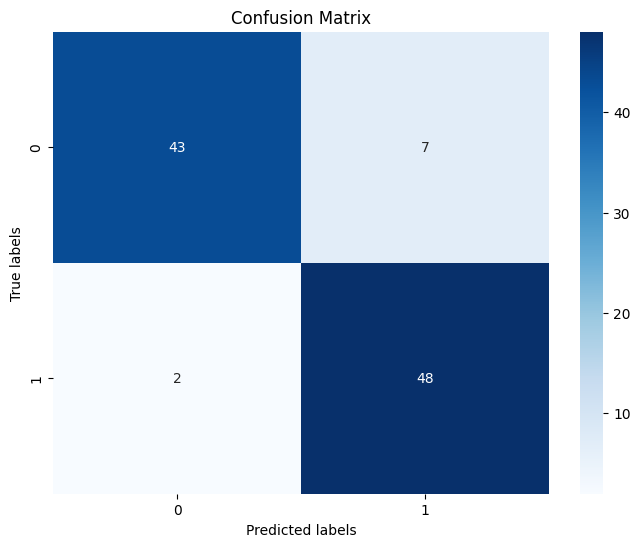

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

accuracy = accuracy_score(true_labels, predictions)
print(f"Acurácia do modelo: {accuracy:.2f}")

# Calcular a precisão
precision = precision_score(true_labels, predictions)
print(f"Precisão do modelo: {precision:.2f}")

# Calcular o recall
recall = recall_score(true_labels, predictions)
print(f"Recall do modelo: {recall:.2f}")

# Calcular o F1-score
f1 = f1_score(true_labels, predictions)
print(f"F1-score do modelo: {f1:.2f}")

# Calcular a matriz de confusão
conf_matrix = confusion_matrix(true_labels, predictions)
print("Matriz de Confusão:")
print(conf_matrix)


plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()



**Análise das métricas e da matriz de confusão:**

A matriz de confusão é uma tabela que mostra o desempenho de um modelo de classificação em suas previsões em relação aos rótulos reais.

De acordo com os resultados da matriz de confusão da nossa rede, observamos os seguintes acertos:

* Verdadeiros Positivos (TP): 43
* Falsos Positivos (FP): 7
* Falsos Negativos (FN): 2
* Verdadeiros Negativos (TN): 48

As métricas calculadas são:

* Acurácia do Modelo: 0.91
* Precisão do Modelo: 0.87
* Recall do Modelo: 0.96
* F1-score do Modelo: 0.91

Esses resultados indicam que o modelo tem um desempenho muito bom na classificação das imagens médicas. Possui uma alta taxa de acurácia e um excelente recall, o que significa que a capacidade do modelo de identificar verdadeiros positivos é alta, minimizando assim falsos negativos. Em contextos médicos, um falso negativo pode ser especialmente prejudicial, pois significa que um paciente que realmente possui a condição em questão pode não receber o diagnóstico correto e, consequentemente, não receber o tratamento adequado. A precisão também é boa, indicando que, quando o modelo prevê uma condição positiva, é provável que esteja correto.

Os resultados alcançados pela rede neural convolucional são significativamente superiores aos obtidos pelo KNN. Enquanto o KNN é um método de aprendizado simples baseado em vizinhança que opera diretamente nos dados, a CNN ResNet-18 é uma arquitetura de rede neural profunda projetada especificamente para tarefas de visão computacional. Ela tem a capacidade de aprender representações complexas e hierárquicas de imagens, o que lhe confere uma vantagem substancial na extração e interpretação de características relevantes dos dados.



Ao usar um modelo pré-treinado, parâmetro **training/loss_epoch** pelo Neptune, foi observado que a curva de perda de treinamento se diminui suavemente, indicando que o modelo está aprendendo os padrões nos dados de forma estável. No entanto, o valor final da perda de treinamento não foi tão baixo quanto o de um modelo não treinado. Isso pode ter ocorrifo devido a diferenças nos dados e na tarefa, limitações no ajuste do modelo pré-treinado aos novos dados e a necessidade de ajustar os hiperparâmetros do modelo para obter um melhor desempenho. Em resumo, é importante ajustar as expectativas ao usar um modelo pré-treinado e estar preparado para ajustar o modelo e os hiperparâmetros conforme necessário para alcançar os melhores resultados.

**Otimização de parametros:**

Para aprimorar as métricas do meu modelo, ajustei o parâmetro de **taxa de aprendizado**, encontrando um valor mais apropriado para o treinamento da rede neural. É importante notar que uma taxa de aprendizado muito alta pode levar a ajustes excessivos, resultando em oscilações ou até divergência na otimização. Por outro lado, uma taxa de aprendizado muito baixa pode retardar o treinamento e deixar a rede estagnada em mínimos locais ou platôs. Portanto, a escolha cuidadosa da taxa de aprendizado é essencial para garantir um treinamento estável e eficaz. Uma taxa de aprendizado adequada facilita a convergência do modelo para um mínimo global da função de perda, resultando em um desempenho aprimorado.

Com o intuito de otimizar minhas métricas, ajustei o tamanho do **lote(batch size)** durante o treinamento. Lotes menores introduzem maior variação nos gradientes, tornando o treinamento menos estável, enquanto lotes maiores suavizam essa variação, promovendo convergência mais rápida. Lotes menores facilitam a exploração ampla do espaço de parâmetros, potencialmente melhorando a generalização. Além disso, consomem menos memória e aceleram as inferências. Por outro lado, lotes maiores podem induzir overfitting sem regularização adequada. Com isso, a escolha do tamanho do lote é um equilíbrio entre estabilidade, velocidade, uso de memória e capacidade de generalização.


Usar **shuffle=True** do Dataloader durante o treinamento é benéfico porque isso embaralha os dados antes de cada época de treinamento. Isso impede que o modelo aprenda a depender da ordem dos exemplos nos dados, o que pode levar ao overfitting e prejudicar a capacidade de generalização do modelo. Em vez disso, o embaralhamento dos dados garante que o modelo seja exposto a uma variedade de exemplos em cada iteração, ajudando-o a aprender padrões mais robustos e a generalizar melhor para dados não vistos. Em resumo, o uso de shuffle=True promove um treinamento mais eficaz e robusto, resultando em modelos mais capazes de lidar com diferentes situações e realizar previsões precisas.




## Parte 3 - Classificação com o DermaMNIST original (opcional para EA979)

### Exercício 3.1

Treine novamente o modelo final do exercício anterior, mas dessa vez utilize o conjunto original de dados do DermaMNIST.

Os dados estão armazenado no arquivo "dermamnist.npz", no diretório **Dados/Ex05** (arquivos deste tipo já foram explorados no parte 5 do Exercício 01). **Note que o conjunto original de dados possui 7 classes distintas, mas estamos interessados apenas em duas classes: casos de carcinoma basocelular (label 1) e melanoma (label 4).** Portanto, você deve filtrar e organizar os dados para que eles sejam utilizados na classificação.

Verifique a quantidade de amostras de cada classe de interesse nos conjuntos de treino, validação e teste. Você deve notar que as duas classes estão desbalanceadas. Busque alternativas para lidar com esse desbalanceamento. Após aplicar as modificações os resultados da rede melhoraram?

Não se esqueça de comentar sobre os métodos utilizados e resultados obtidos, tentando justificar as decisões que foram tomadas.

In [7]:


import numpy as np

# Carregando o arquivo .npz
path = f"gdrive/MyDrive/Dados/Ex05/"

data = np.load(path+'dermamnist.npz')
print(data.files) # exibindo as classe do arquivo .npz

# Acessando a classe treinamento, validação e teste do arquivo
train_image = data['train_images']
train_labels = data['train_labels']

val_images = data['val_images']
val_labels = data['val_labels']

test_images = data['test_images']
test_labels = data['test_labels']

'''
Nesta etapa, estou identificando os índices dos rótulos iguais a 1
e iguais a 4 nos conjuntos de dados de treino, validação e teste
'''

indices_1_tr_img = np.where(np.array(train_labels) == 1)[0]
indices_4_tr_img = np.where(np.array(train_labels) == 4)[0]

indices_1_val_img = np.where(np.array(val_labels) == 1)[0]
indices_4_val_img = np.where(np.array(val_labels) == 4)[0]

indices_1_test_img = np.where(np.array(test_labels) == 1)[0]
indices_4_test_img = np.where(np.array(test_labels) == 4)[0]


train_image_1 = []
train_image_4 = []

val_image_1 = []
val_image_4 = []

test_image_1 = []
test_image_4 = []

'''
Após encontrar os indices referente as classes de treino, validação e teste.
O próximo passo agora é separar as amostras refentes aos casos de carcinoma
basocelular (label 1) e melanoma (label 4) com base nos indices localizados acima.
'''

# seleciona todas a imagens de treino dos  casos de carcinoma basocelular (label 1)
for i in indices_1_tr_img:
  train_image_1.append(train_image[i])

# seleciona todas a imagens de treino dos casos de melanoma (label 4)
for i in indices_4_tr_img:
  train_image_4.append(train_image[i])

# seleciona todas a imagens de validação dos casos de carcinoma basocelular (label 1)
for i in indices_1_val_img:
  val_image_1.append(val_images[i])

# seleciona todas a imagens de validação dos casos de melanoma (label 4)
for i in indices_4_val_img:
  val_image_4.append(val_images[i])

# seleciona todas a imagens de teste dos  casos de carcinoma basocelular (label 1)
for i in indices_1_test_img:
  test_image_1.append(test_images[i])

# seleciona todas a imagens de teste dos casos de melanoma (label 4)
for i in indices_4_test_img:
  test_image_4.append(test_images[i])




['train_images', 'val_images', 'test_images', 'train_labels', 'val_labels', 'test_labels']


In [8]:
'''
Devido ao desbalanceamento dos conjuntos de dados de treino, validação e teste,
optei por utilizar uma técnica chamada data augmentation para lidar com esse problema.
Essa abordagem envolve aplicar transformações artificiais às imagens do conjunto de dados
original, com o objetivo de aumentar sua diversidade e quantidade. Isso permite que o modelo
aprenda características mais robustas e generalizáveis, especialmente em conjuntos de dados
pequenos ou desbalanceados. Para este exercício específico, escolhi aplicar as transformações
 de rotação, espelhamento (flip) e recorte aleatório (random crop).
'''


import cv2
import numpy as np
from PIL import Image
from scipy.ndimage import rotate
from scipy.ndimage import zoom
from skimage.transform import resize


'''
É importante mencionar que, para evitar possíveis artefatos nas bordas ao aplicar
a rotação, optei por realizar a rotação das imagens apenas em ângulos
específicos, como 90°, 180° e 270°, de forma aleatória.
'''
angles = [90, 180, 270]

# Função para aplicar rotação aleatória em uma imagem
def rotate_image(image):
    rotated_image = rotate(image, angles[np.random.randint(0, 3)], reshape=False)
    return rotated_image


# Função para aplicar espelhamento horizontal em uma imagem
def flip_image(image):
    if np.random.rand() < 0.5:
        flipped_image = np.flip(image, axis=1)  # Espelha horizontalmente
    else:
        flipped_image = np.flip(image, axis=0)  # Espelha verticalmente
    return flipped_image

def resize_image(image, target_size):
    # Redimensiona a imagem para o tamanho desejado
    resized_image = np.array(Image.fromarray(image).resize(target_size))

    return resized_image


def random_crop(image, crop_size):
    # Obtém as dimensões da imagem original
    original_height, original_width = image.shape[:2]

    # Obtém as dimensões do corte
    crop_height, crop_width = (crop_size, crop_size)

    # Calcula os limites para o corte
    max_y = original_height - crop_height
    max_x = original_width - crop_width

    # Escolhe aleatoriamente a posição do corte
    start_y = np.random.randint(0, max_y)
    start_x = np.random.randint(0, max_x)

    # Realiza o corte na imagem
    cropped_image = image[start_y:start_y+crop_height, start_x:start_x+crop_width]
    original_size = (original_height, original_width)  # (largura, altura)

    # Redimensiona o corte para o tamanho original
    resized_cropped_image = resize_image(cropped_image, original_size)
    return resized_cropped_image

def gen_img(num_images, rand_img, _images_):

   #Args:
   #num_images: Número de imagens aumentadas a serem geradas ou seja o numero de imagens que falta para completar o dataset
   #rand_img: Define o intervalo máximo de imagens que a função rand irá escolher aleatoriamente
   #_images_: Define o conjunto de imagens na qual irá ser aplicada a augmentação

  # Lista para armazenar as imagens aumentadas
  augmented_images = []

  # Contador para controlar o número de imagens geradas
  generated_images_count = 0

  # Loop até que o número desejado de imagens seja gerado
  while generated_images_count < num_images:
      # Escolher uma imagem aleatória do array original_images
      n = np.random.randint(0, rand_img)
      #n = 0
      original_image = (_images_[n])
      #original_image = (_images_[n])

      # Aplicar aumentos de dados na imagem escolhida
      augmented_image = rotate_image(original_image)
      augmented_image = random_crop(augmented_image, 18)
      augmented_image = flip_image(augmented_image)
      #print(augmented_image.shape)
      # Armazenar a imagem aumentada na lista
      augmented_images.append(augmented_image)

      # Incrementar o contador de imagens geradas
      generated_images_count += 1
  return augmented_images

# Converter a lista de imagens aumentadas em um array numpy
augmented_train_images = np.array(gen_img(420, 359,train_image_1))
augmented_val_images = np.array(gen_img(59, 52,val_image_1))
augmented_test_images = np.array(gen_img(120, 103,test_image_1))



In [9]:
# Abaixo é feito a concatenação das imagens originais com as imagens aumentadas
train_image_1 = np.array(train_image_1)

train_image_1_full = np.concatenate((train_image_1, augmented_train_images), axis=0)

val_image_1 = np.array(val_image_1)

val_image_1_full = np.concatenate((val_image_1, augmented_val_images), axis=0)

test_image_1 = np.array(test_image_1)

test_image_1_full = np.concatenate((test_image_1, augmented_test_images), axis=0)

'''
Após realizar o aumento de imagens para os conjuntos de treino 'train_image_1', validação
'val_image_1' e teste 'test_image_1', conforme explicado anteriormente, o próximo passo é
concatenar as imagens aumentadas dos conjuntos de treino, validação e teste associadas ao
rótulo 1 com as imagens correspondentes dos conjuntos de treino, validação e teste do rótulo 4.
'''
train_image = np.concatenate((train_image_1_full, train_image_4), axis=0)
val_images = np.concatenate((val_image_1_full, val_image_4), axis=0)
test_images = np.concatenate((test_image_1_full, test_image_4), axis=0)

print('Shape imagens treino:',(train_image.shape))
print('Shape imagens validação:',(val_images.shape))
print('Shape imagens teste:',(test_images.shape))

Shape imagens treino: (1558, 28, 28, 3)
Shape imagens validação: (222, 28, 28, 3)
Shape imagens teste: (446, 28, 28, 3)


In [10]:
# Agora é gerado os labels referentes ao rotulo 1 e a rotulo 4 para as classes de treino, validação e teste
label_1 = np.ones(779)
label_4 = [4] * 779
label_4 = np.array(label_4)
labels_train = np.concatenate(((label_1), (label_4)), axis=0)


label_1 = np.ones(111)
label_4 = [4] * 111
label_4 = np.array(label_4)
labels_val = np.concatenate(((label_1), (label_4)), axis=0)

label_1 = np.ones(223)
label_4 = [4] * 223
label_4 = np.array(label_4)
labels_test = np.concatenate(((label_1), (label_4)), axis=0)



In [11]:
import numpy as np
import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader

'''
Esta classe personalizada herda da classe Dataset do PyTorch e é utilizada para criar
conjuntos de dados personalizados destinados ao treinamento de redes neurais a partir
de listas ou matrizes. Ao ser invocada, ela retorna uma tupla contendo a imagem e seu
respectivo rótulo associado.
'''
class CustomDataset(Dataset):
    """
        Inicializa a classe CustomDataset.

        Args:
            images (list ou ndarray): Lista ou matriz contendo as imagens do conjunto de dados.
            labels (list ou ndarray): Lista ou matriz contendo os rótulos correspondentes das imagens.
            transform (callable, opcional): Transformações a serem aplicadas nas imagens.
                Pode ser None se nenhuma transformação for necessária.
                Padão é None.
        """

    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        """
        Retorna uma amostra específica do conjunto de dados com o índice idx.

        Args:
            idx (int): Índice da amostra a ser recuperada.

        Returns:
            tuple: Uma tupla contendo a imagem e seu rótulo correspondente.
        """
        image = self.images[idx]
        label = self.labels[idx]
        # Convertendo os rótulos para o tipo de dados correto (torch.long)
        label = torch.tensor(label, dtype=torch.long)


        if self.transform:
            image = self.transform(image)

        return image, label

# Definir transformações a serem aplicadas às imagens
transform = transforms.Compose([
    transforms.ToTensor(),  # Convertendo a imagem para tensor
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizando os valores dos pixels
])

# Criar conjunto de dados personalizado com transformações
train_image_dataset = CustomDataset(train_image, labels_train, transform=transform)
val_image_dataset = CustomDataset(val_images, labels_val, transform=transform)
test_image_dataset = CustomDataset(test_images, labels_test, transform=transform)



Shape do batch: torch.Size([100, 3, 28, 28])


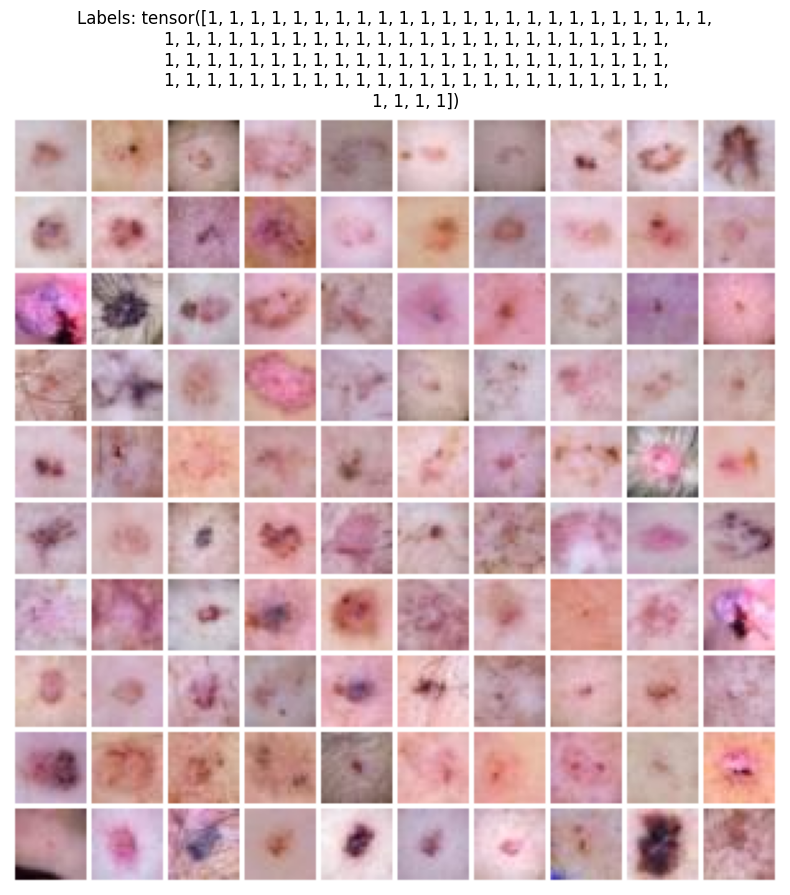

In [12]:
'Essa função é usada para visualizar imagens dos datasets antes do treinamento'
def show_image(dataset, size):

  data_loader = torch.utils.data.DataLoader(dataset, batch_size=size, shuffle=False)
  # Itera sobre o primeiro lote de dados

  images, labels = next(iter(data_loader))


  print("Shape do batch:", images.shape)
  img_grid = make_grid(images, nrow=10, pad_value=1)
  fig = plt.figure(figsize=(10,10))
  plt.imshow(img_grid.permute(1, 2, 0).numpy())
  plt.title(f'Labels: {labels}')
  plt.axis('off')
  plt.show()


show_image(test_image_dataset, 100)

In [29]:
# defini os parametros

hparams_2 = {"experiment_name": "Test_ResNet_2",  # experiment name identifies the run for later
           "max_epochs": 100,  # number of epochs to train
           "batch_size_train": 128,  # size of batch
           "batch_size_val": 128,  # size of batch
           "nworkers": mp.cpu_count(),  # number of workers to use in parallel loading
           "nout": 10,  # number of classes
           "nin": 3,  # number of channels of the input image
           "lr": 1e-5,  # learning rate
           "wd": 1e-5,  # weight decay for optimizer
           "cpu": False,  # forces using the CPU
           }
'''
Estamos tentando distinguir entre imagens pertencentes a dois grupos diferentes: carcinoma basocelular (rótulo 1) e melanoma (rótulo 4).
Cada imagem é atribuída a uma dessas duas classes: rótulo 1 ou rótulo 4. Para representar o número de classes, utilizamos "nout" = 2.

Além disso, como estamos lidando com imagens coloridas no formato RGB, onde cada pixel é representado por três valores correspondentes às
intensidades de vermelho, verde e azul, o parâmetro que representa o número de canais, "nin", é definido como três.
'''

'\nEstamos tentando distinguir entre imagens pertencentes a dois grupos diferentes: carcinoma basocelular (rótulo 1) e melanoma (rótulo 4).\nCada imagem é atribuída a uma dessas duas classes: rótulo 1 ou rótulo 4. Para representar o número de classes, utilizamos "nout" = 2.\n\nAlém disso, como estamos lidando com imagens coloridas no formato RGB, onde cada pixel é representado por três valores correspondentes às\nintensidades de vermelho, verde e azul, o parâmetro que representa o número de canais, "nin", é definido como três.\n'

In [17]:
'''
Esta classe é usada para preparar e carregar dados para treinamento e validação
da rede utilizando PyTorch Lightning. Ela permite configurar conjuntos de dados de
treinamento e validação, bem como obter DataLoaders para esses conjuntos de dados.
'''

class Skin_Image_DataModule(pl.LightningDataModule):
    def __init__(self, hparams):
        '''
        Args:
            hparams (dict): Dicionário contendo os hiperparâmetros para configurar o módulo de dados.
        '''
        super().__init__()
        self.save_hyperparameters(hparams)

    def setup(self, stage=None):
        # Define os conjuntos de dados de treinamento e validação
        self.train = train_image_dataset
        self.val = val_image_dataset


    def train_dataloader(self):
        # Retorna o DataLoader para o conjunto de dados de treinamento
        return DataLoader(self.train, batch_size=self.hparams.batch_size_train, num_workers=self.hparams.nworkers, shuffle=True)

    def val_dataloader(self):
        # Retorna o DataLoader para o conjunto de dados de validação
        return DataLoader(self.val, batch_size=self.hparams.batch_size_val, num_workers=self.hparams.nworkers, shuffle=False)


In [18]:
from torch import nn
from torchmetrics import Accuracy

'''
Esta classe herda de LightningModule do PyTorch Lightning e é responsável por definir a arquitetura
do modelo, calcular as perdas, atualizar os pesos durante o treinamento e avaliar o desempenho do modelo.

'''
class Train_Skin_Image(pl.LightningModule):
    def __init__(self, hparams):
        super().__init__()

        self.save_hyperparameters(hparams)
        self.model = cnn_model
        self.loss = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=self.hparams.nout)

        torchinfo.summary(self.model)

    def forward(self, x):
        '''
        Método forward que define como os dados fluem através do modelo

        Args:
            x (torch.Tensor): Os dados de entrada

        Returns:
            torch.Tensor: As previsões do modelo
        '''
        return self.model(x).softmax(dim=-1)

    def classification_step(self, mode, batch):
        '''
        Método para executar uma etapa de classificação durante o treinamento ou a validação.

        Args:
            mode (str): Modo de operação, "train" para treinamento e "val" para validação.
            batch (tuple): Um lote de dados contendo imagens e rótulos.

        Returns:
            torch.Tensor: A perda calculada durante a etapa de classificação.

        '''
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss(y_hat, y)

        if mode == "train":
            self.log("loss", loss, on_epoch=True, on_step=True)
            return loss
        elif mode == "val":
            _, preds = torch.max(y_hat, 1)
            self.accuracy(preds, y)
            self.log("val_loss", loss, on_epoch=True, on_step=False, prog_bar=True)
            self.log("val_acc", self.accuracy, on_epoch=True, on_step=False, prog_bar=True)

    def training_step(self, train_batch, batch_idx):
        '''
        Método para executar uma etapa de treinamento.

        Args:
            train_batch (tuple): Um lote de dados de treinamento contendo imagens e rótulos.
            batch_idx (int): O índice do lote atual.

        Returns:
            torch.Tensor: A perda calculada durante a etapa de treinamento.

        '''
        return self.classification_step("train", train_batch)

    def validation_step(self, val_batch, batch_idx):
        '''
        Método para executar uma etapa de validação

        Args:
            val_batch (tuple): Um lote de dados de validação contendo imagens e rótulos.
            batch_idx (int): O índice do lote atual

        '''
        self.classification_step("val", val_batch)

    def configure_optimizers(self):
        '''
        Método para configurar o otimizador a ser utilizado durante o treinamento.

        Returns:
            torch.optim.Optimizer: O otimizador configurado.
        '''
        optimizer = AdamW(self.model.parameters(), lr=self.hparams.lr, weight_decay=self.hparams.wd)

        return optimizer


In [19]:

'''
Este código define a arquitetura de uma rede neural convolucional ResNet-18 para classificação de imagens.

A rede é construída a partir do modelo ResNet-18 pré-treinado disponível no PyTorch torchvision,
com os pesos inicializados aleatoriamente.

O código substitui a camada de convolução inicial (conv1) para se ajustar ao número de canais de entrada
definido nos hiperparâmetros (hparams_2['nin']). Em seguida, a camada totalmente conectada (fc) é substituída
por uma nova camada linear com o número de unidades de saída definido nos hiperparâmetros (hparams_2['nout']).

Attributes:
    cnn_model (torch.nn.Module): O modelo da rede neural convolucional ResNet-18 modificado.
'''


# Carregar o modelo ResNet-18 pré-treinado
#cnn_model = models.resnet18(pretrained=True)

# Carregar o modelo ResNet-18 pré-treinado com pesos iniciais aleatórios
cnn_model = models.resnet18(weights=None)
cnn_model.conv1 = nn.Conv2d(hparams_2['nin'], 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
num_ftrs = cnn_model.fc.in_features
cnn_model.fc = nn.Linear(num_ftrs, hparams_2['nout'])



In [ ]:
import os
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.loggers import NeptuneLogger
import neptune.new as neptune


debug = False  # Turn this True to test the code with a quick run

# Este código inicializa um novo experimento no Neptune, uma plataforma para registro e visualização de experimentos de aprendizado de máquina.

log_dir = f"gdrive/MyDrive/logs_lightning1"

# Este código inicializa um novo experimento no Neptune, uma plataforma para registro e visualização de experimentos de aprendizado de máquina.
run = neptune.init_run(
    project='joelavmendonca/skinimageteste',
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJlOTQ4MDI5Ny1mMjdhLTRkMmMtYTk0Ny0zMzg1NmU1YTI2NWEifQ==",
    )

run["parameters"] = {
    "learning_rate": hparams_2["lr"],
    "max_epochs": hparams_2["max_epochs"],
    # Adicione outros hiperparâmetros aqui
}

# Este código configura o logger do TensorBoard para registrar os dados do treinamento e validação em um diretório específico.
logger = TensorBoardLogger(log_dir, name="skin_logs_1")

# Inicializa o logger do Neptune para registro de métricas e parâmetros
neptune_logger = NeptuneLogger(
    api_key="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJlOTQ4MDI5Ny1mMjdhLTRkMmMtYTk0Ny0zMzg1NmU1YTI2NWEifQ==",  # Substitua YOUR_API_KEY pelo seu token de API do Neptune
    project="joelavmendonca/skinimageteste",  # Substitua 'username/project_name' pelo seu nome de usuário e nome do projeto
    name="skinimageteste"  # Defina o nome do experimento
)

# Definindo os parâmetros do neptune
#neptune_logger.log_param('learning_rate', hparams['lr'])
#neptune_logger.log_param('max_epochs', hparams['max_epochs'])

#####

# Initialization
# Este código instancia o modelo de rede neural e o módulo de dados para treinamento e validação.
model = Train_Skin_Image(hparams_2)
data = Skin_Image_DataModule(hparams_2)



# The PL trainer can run various callbacks during training. Here we only use the
# callback that saves the weights of the trained network.
os.makedirs(log_dir, exist_ok=True)

# Este código configura o treinamento do modelo, incluindo a definição de callbacks e outros parâmetros.
checkpoint_callback = [ModelCheckpoint(dirpath=log_dir,  # path to save checkpoint
                                       filename=hparams_2["experiment_name"] + '-'+ str(hparams_2["batch_size_train"])+ '-' +str(hparams_2["batch_size_val"]) + '-'+ str(hparams_2["lr"]) +"-{epoch}-{val_acc:.2f}",
                                       monitor="val_acc",
                                       mode="max")]

# Este código configura o objeto Trainer do PyTorch Lightning para controlar o treinamento do modelo.
trainer = pl.Trainer(max_epochs=hparams_2["max_epochs"],
                     fast_dev_run=debug,
                     callbacks=checkpoint_callback,
                     logger=neptune_logger,
                     #logger = logger,
                     log_every_n_steps=1
                     )
print("Hyperparameters:\n")
for k, v in hparams_2.items():
    print(f'{k}: {v}')


trainer.fit(model, data)
neptune_logger.experiment.stop()


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/joelavmendonca/skinimageteste/e/SKIN-151


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Hyperparameters:

experiment_name: Test_ResNet_2
max_epochs: 50
batch_size_train: 1558
batch_size_val: 222
nworkers: 2
nout: 10
nin: 3
lr: 0.0001
wd: 1e-05
cpu: False
[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/joelavmendonca/skinimageteste/e/SKIN-152


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /content/gdrive/MyDrive/logs_lightning1 exists and is not empty.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNet             | 11.2 M
1 | loss     | CrossEntropyLoss   | 0     
2 | accuracy | MulticlassAccuracy | 0     
------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.727    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

In [24]:
'''
Carrega um modelo treinado a partir de um arquivo de checkpoint e define o modo de avaliação

'''
baseline_model = (f"gdrive/MyDrive/logs_lightning1/Test_ResNet_2-128-128-1e-05-epoch=20-val_acc=0.92.ckpt")
#print(f"Using model {baseline_model}")

# Load trained model
model = Train_Skin_Image.load_from_checkpoint(baseline_model)#.eval().cuda()
model.eval()
device = torch.device("cpu")
model.to(device)

Train_Skin_Image(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [25]:
#Define o dispositivo de computação disponível e move o modelo para o dispositivo especificado.

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#print(device)
cnn_model.to(device)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [26]:
# Realiza a inferência do modelo em um conjunto de dados de teste e armazena as previsões e os rótulos verdadeiros.

test_loader = DataLoader(test_image_dataset, batch_size=446, shuffle=False)
# Lista para armazenar as previsões do modelo
predictions = []
# Lista para armazenar os rótulos verdadeiros
true_labels = []

with torch.no_grad():
    # Iterar sobre os lotes de dados de teste
    for images, labels in test_loader:
        # Mover os dados para o dispositivo
        images = images.to(device)
        labels = labels.to(device)

        # Realizar a inferência (previsões)
        outputs = model(images)

        # Obter as previsões convertendo as saídas do modelo em rótulos preditos
        _, predicted = torch.max(outputs, 1)

        # Adicionar as previsões e os rótulos verdadeiros às listas
        predictions.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())





Acurácia do modelo: 0.90
Precisão do modelo: 0.90
Recall do modelo: 0.90
F1-score do modelo: 0.90
Matriz de Confusão:
[[200  23]
 [ 22 201]]


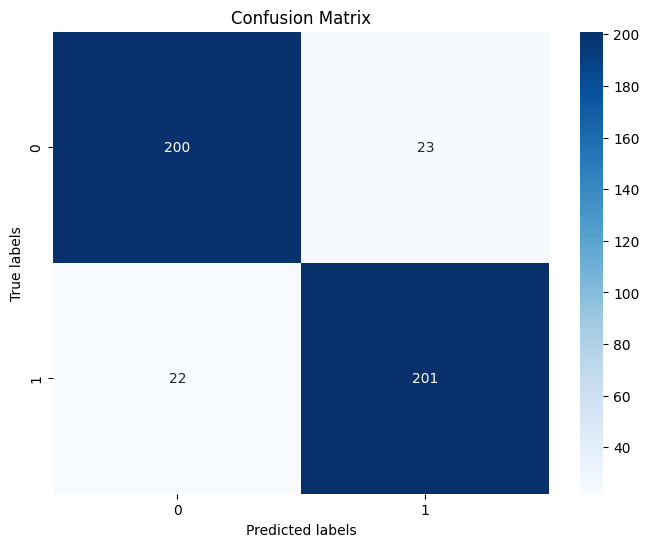

In [28]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

'''
Calcula e exibe várias métricas de avaliação do modelo, incluindo acurácia,
precisão, recall, F1-score e matriz de confusão.
'''

accuracy = accuracy_score(true_labels, predictions)
print(f"Acurácia do modelo: {accuracy:.2f}")

# Calcular a precisão
precision = precision_score(true_labels, predictions)
print(f"Precisão do modelo: {precision:.2f}")

# Calcular o recall
recall = recall_score(true_labels, predictions)
print(f"Recall do modelo: {recall:.2f}")

# Calcular o F1-score
f1 = f1_score(true_labels, predictions)
print(f"F1-score do modelo: {f1:.2f}")

# Calcular a matriz de confusão
conf_matrix = confusion_matrix(true_labels, predictions)
print("Matriz de Confusão:")
print(conf_matrix)


plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


**Análise das métricas e da matriz de confusão:**

A matriz de confusão é uma tabela que mostra o desempenho de um modelo de classificação em suas previsões em relação aos rótulos reais.

De acordo com os resultados da matriz de confusão da nossa rede, observamos os seguintes acertos:

* Verdadeiros Positivos (TP): 200
* Falsos Positivos (FP): 23
* Falsos Negativos (FN): 22
* Verdadeiros Negativos (TN): 201

As métricas calculadas são:

* Acurácia do Modelo: 0.90
* Precisão do Modelo: 0.90
* Recall do Modelo: 0.90
* F1-score do Modelo: 0.90


A análise das métricas de desempenho revela que o modelo de classificação de imagens médicas alcançou um nível de eficácia notável. Com uma acurácia de 0.90, o modelo demonstra uma confiabilidade de 90% em suas previsões. A precisão, também estabelecida em 0.90, reforça a consistência do modelo em identificar corretamente as condições positivas. O recall, igualmente avaliado em 0.90, assegura que uma grande maioria dos casos positivos verdadeiros são capturados pelo modelo. O F1-score, mantendo-se em 0.90, sintetiza a precisão e o recall, refletindo um equilíbrio harmonioso entre a sensibilidade e a especificidade do modelo.

Essas métricas são bastante sólidas, especialmente considerando que estão sendo aplicadas a imagens médicas, que geralmente são um desafio para a classificação devido à sua complexidade.

**Otimização de parametros:**

Para aprimorar as métricas do meu modelo, ajustei o parâmetro de **taxa de aprendizado**, encontrando um valor mais apropriado para o treinamento da rede neural. É importante notar que uma taxa de aprendizado muito alta pode levar a ajustes excessivos, resultando em oscilações ou até divergência na otimização. Por outro lado, uma taxa de aprendizado muito baixa pode retardar o treinamento e deixar a rede estagnada em mínimos locais ou platôs. Portanto, a escolha cuidadosa da taxa de aprendizado é essencial para garantir um treinamento estável e eficaz. Uma taxa de aprendizado adequada facilita a convergência do modelo para um mínimo global da função de perda, resultando em um desempenho aprimorado.

Com o intuito de otimizar minhas métricas, ajustei o tamanho do **lote(batch size)** durante o treinamento. Lotes menores introduzem maior variação nos gradientes, tornando o treinamento menos estável, enquanto lotes maiores suavizam essa variação, promovendo convergência mais rápida. Lotes menores facilitam a exploração ampla do espaço de parâmetros, potencialmente melhorando a generalização. Além disso, consomem menos memória e aceleram as inferências. Por outro lado, lotes maiores podem induzir overfitting sem regularização adequada. Com isso, a escolha do tamanho do lote é um equilíbrio entre estabilidade, velocidade, uso de memória e capacidade de generalização.



Ao usar um modelo pré-treinado, parâmetro **training/loss_epoch** pelo Neptune, foi observado que a curva de perda de treinamento se diminui suavemente, indicando que o modelo está aprendendo os padrões nos dados de forma estável. No entanto, o valor final da perda de treinamento não foi tão baixo quanto o de um modelo não treinado. Isso pode ter ocorrifo devido a diferenças nos dados e na tarefa, limitações no ajuste do modelo pré-treinado aos novos dados e a necessidade de ajustar os hiperparâmetros do modelo para obter um melhor desempenho. Em resumo, é importante ajustar as expectativas ao usar um modelo pré-treinado e estar preparado para ajustar o modelo e os hiperparâmetros conforme necessário para alcançar os melhores resultados.

Usar **shuffle=True** do Dataloader durante o treinamento é benéfico porque isso embaralha os dados antes de cada época de treinamento. Isso impede que o modelo aprenda a depender da ordem dos exemplos nos dados, o que pode levar ao overfitting e prejudicar a capacidade de generalização do modelo. Em vez disso, o embaralhamento dos dados garante que o modelo seja exposto a uma variedade de exemplos em cada iteração, ajudando-o a aprender padrões mais robustos e a generalizar melhor para dados não vistos. Em resumo, o uso de shuffle=True promove um treinamento mais eficaz e robusto, resultando em modelos mais capazes de lidar com diferentes situações e realizar previsões precisas.
